<a href="https://colab.research.google.com/github/vishal310197/Social-Network-Analysis/blob/main/Copy_of_Copy_of_Social_Network.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [1]:
# import libraries
import pandas as pd
from collections import Counter
import matplotlib.pyplot as plt
import re

In [2]:
Tweet_df = pd.read_csv('/content/drive/MyDrive/Traineeship/reddit_english_body.csv')
Tweet_df.head(5)

,Unnamed: 0,title,subreddit,score,num_comments,created,author,comments,body
0,4,CONFUSED ABOUT ROADTRIP. HELP!,sweden,0,14,1.678963e+09,Kushsinatra,<praw.models.comment_forest.CommentForest obje...,Hey everyone!\n\nhttps://preview.redd.it/pmso...
1,8,Mumma recipe – please help,sweden,0,8,1.679094e+09,strawberriesancream,<praw.models.comment_forest.CommentForest obje...,"Please, help me out. A coffee shop next to me ..."
2,9,"Hello, Sweden! Help me build a playlist with 1...",sweden,267,234,1.670012e+09,csnfool,<praw.models.comment_forest.CommentForest obje...,Hello everyone!\n\nMe and my sister-in-law are...
3,11,Australians seeking help from Swedes!,sweden,30,28,1.674945e+09,bigbrownpuppyeyes,<praw.models.comment_forest.CommentForest obje...,"Hej alla, \nMy fiance and I and some friends a..."
4,12,"Ok, I’ve been looking for a possibly Swedish m...",sweden,4,25,1.676233e+09,Phastic,<praw.models.comment_forest.CommentForest obje...,"I’m not 100% sure if it’s Swedish, but the end..."


In [ ]:
len(Tweet_df['author'].unique())

5489

In [3]:
count = 0
for i in Tweet_df['author'].value_counts():
  if i>1:
    count = count+1
print(count)
#Tweet_df['author'].value_counts()

934


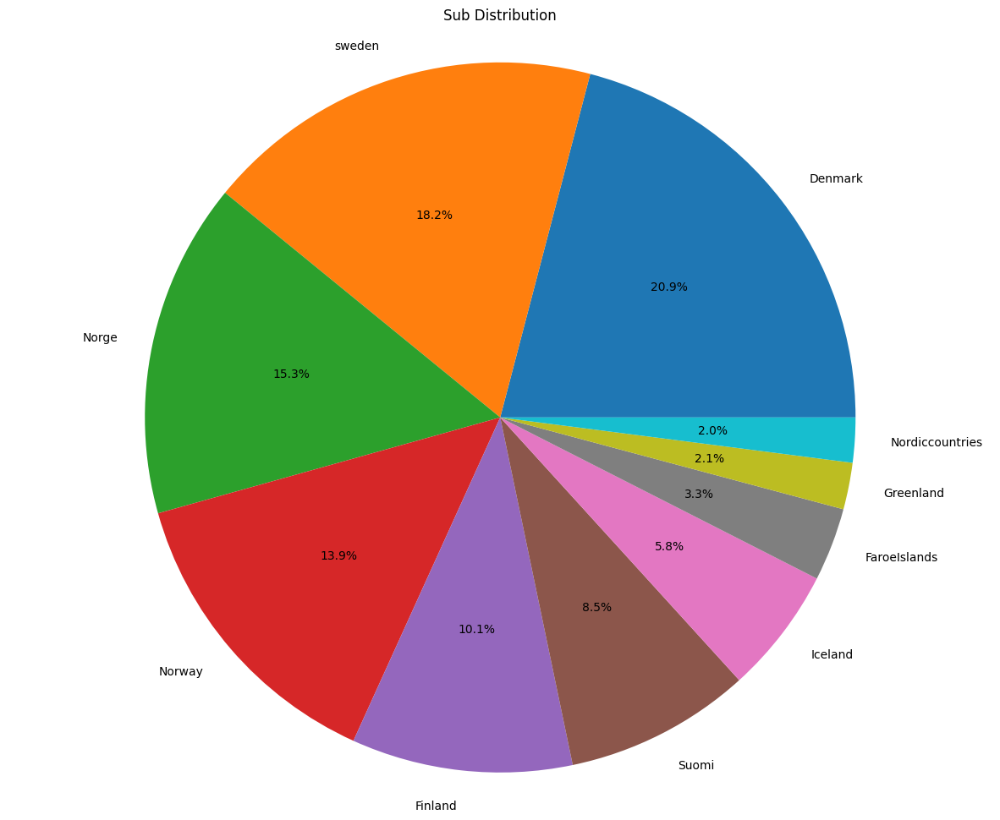

In [4]:
# Count the occurrences of each language
language_counts = Tweet_df['subreddit'].value_counts()

# Increase the figure size
plt.figure(figsize=(15, 12))


# Create the pie chart
plt.pie(language_counts, labels=language_counts.index, autopct='%1.1f%%')

# Set aspect ratio to make the pie chart circular
plt.axis('equal')

# Add a title
plt.title('Sub Distribution')

# Display the chart
plt.show()

In [ ]:
# Create an empty set to store the unique hashtags
import ast
import numpy as np
unique_hashtags = set()

# Iterate over each row in the 'Hashtags' column
for hashtag in Tweet_df['author']:
  unique_hashtags.add(hashtag)

# Print the set of unique hashtags
print(unique_hashtags)
len(unique_hashtags)

{'Rollo_deVarennes', 'kycbo', 'LissXoc-1984', 'ThrashingTrash8', 'DrNuclearMed', 'stevensile', 'Regasroth', 'Rubysamurai306', 'wonderfulquest', 'Naxxaramas', 'RootNinja', 'ProofOfStakes', 'Giovanni_sanna', 'Quiet_Bus_6404', 'Sapotis', 'Skirtz', 'BE_power7x7', 'ReallyIkidyounot', 'AtlasBurden', 'EasyGrowth2387', 'GraceGrace87', 'Mediocre-Presence-81', 'lux514', 'Interesting-Bug-3636', 'TheGoodOttoKatz', 'HornyPlatypus420', 'Dnarg', 'jansskon', 'Candid-Ad443', 'naargeilo', 'AbaloneWide7655', 'CaptainGoose', 'Special-Cookie-9437', 'hellosalsa', 'mogzhey2711', 'nelliexox', 'OrbitalTurtle', 'Ugorism', 'stockholmishome', 'Illustrious-Crazy841', 'Ceylontsimt', 'ana_andra', 'SheerPanicNow', 'OneAlexander', 'mrc14345', 'RigesKlaine', 'HealthWild', 'FraSuomi', 'cnovrup', 'Zero_Mehanix', 'KapybaraSuomi', 'jrrybock', 'tatt_addict', 'Tommtomm2', 'BLTAMA', 'James_Wang_C', 'Remote-Ad-1563', 'aitosuvi', 'NeonRitual', 'CoffeeVikings', 'iTzDanilion', 'Runic_reader451', 'Panzerjoeden', 'beph90', 'hapticg

5489

In [ ]:
# Convert the 'Hashtags' column to lowercase
Tweet_df['Hashtags'] = Tweet_df['Hashtags'].astype(str).str.lower()

# create a list that contains main hashtags
main_hashtags= ['emergency', 'TrafficAccident', 'Ambulance', '112',
                 '113', 'Fire', 'Safety', 'SOS',
                 'SOSAlarm','ensihoito', 'punainenristi', 'hätäkeskus', 'liikenneonnettomuus', 'MSB'
                 , '110sentralen', 'kystvakten', 'ambulanssjukvård', '112dk'
                 , '112is', 'Landhelgisgaeslan', 'DMA_sikkerhed']

# Convert the list to lowercase
main_hashtags = [x.lower() for x in main_hashtags]

# define a regular expression to find hashtags in the dataframe's hashtag coulmn
regex = re.compile(r'\b(?:' + '|'.join(main_hashtags) + r')\b', re.IGNORECASE)

# extract only the relevant columns from the dataframe
relevant_columns = ['Hashtags']

# create a new column 'hashtags' containing a list of hashtags found in each tweet
Tweet_df['main_hashtag'] = Tweet_df[relevant_columns].apply(lambda x: list(set(re.findall(regex, x['Hashtags'])) & set(main_hashtags)), axis=1)

In [ ]:
unique_hashtags = [x.lower() for x in unique_hashtags]
regex = re.compile(r'\b(?:' + '|'.join(unique_hashtags) + r')\b', re.IGNORECASE)
relevant_columns = ['Hashtags']
Tweet_df['all_hashtag'] = Tweet_df[relevant_columns].apply(lambda x: list(set(re.findall(regex, x['Hashtags'])) & set(unique_hashtags)), axis=1)

In [ ]:
Tweet_df.head(10)

,Unnamed: 0.2,Unnamed: 0,Unnamed: 0.1,Id,Date,User,Tweet,Retweet,Like,Language,Hashtags,Place,Year,main_hashtag,all_hashtag
0,0,0,0,911136538536407040,2017-09-22 07:54:13+00:00,ackert,Reflective decor is important for safety and v...,0,0,sv,"['volvocars', 'trafficaccident']",Sweden,2017,[trafficaccident],"[volvocars, trafficaccident]"
1,1,1,1,774190149445963776,2016-09-09 10:18:10+00:00,angelinaelander,Was in a #trafficaccident #yesterday got #hitb...,0,0,sv,"['trafficaccident', 'yesterday', 'hitbycar', '...",Sweden,2016,[trafficaccident],"[bruises, nothingbroken, hitbycar, yesterday, ..."
2,2,2,2,191495285183234048,2012-04-15 11:56:48+00:00,foreignresort,@bugazer Nice one! I'd have to be careful abou...,0,0,en,"['netflix', 'totaladdiction', 'trafficaccident']",Denmark,2012,[trafficaccident],"[totaladdiction, trafficaccident, netflix]"
3,3,3,3,1587562822539661314,2022-11-01 21:50:47+00:00,KristinHaikio,A sucessful meeting with the expert-/userpanel...,0,2,en,"['mentalhealth', 'paramedic', 'ambulance']",Norway,2022,[ambulance],"[paramedic, ambulance, mentalhealth]"
4,4,7,7,1404535197039747082,2021-06-14 20:24:20+00:00,bjornmgray,Ambulance emergency sirens https://t.co/rMhje3...,0,2,en,"['ambulance', 'emergency', 'sirens']",Norway,2021,"[ambulance, emergency]","[sirens, emergency, ambulance]"
5,5,8,8,1401938885588959239,2021-06-07 16:27:31+00:00,burny_burner,Further proof that KSA has no idea what they a...,0,0,sv,"['ksa', 'ambulance', 'vemskattepengarlekerdomm...",Sweden,2021,[ambulance],"[ambulance, vemskattepengarlekerdommed, ksa]"
6,6,9,9,1335162374114963457,2020-12-05 10:01:30+00:00,JessyGrades,Have you been drinking? Choose who you would l...,0,0,en,"['iceland', 'socialmarketing', 'police', 'ambu...",Iceland,2020,[ambulance],"[taxi, ambulance, socialmarketing, driverespon..."
7,7,10,10,1270425624633659394,2020-06-09 18:40:46+00:00,Emmyhellgren,Keeping stockholm safe tonight. 🚑 #ivpa #ambul...,0,3,en,"['ivpa', 'ambulance']",Sweden,2020,[ambulance],"[ambulance, ivpa]"
8,8,11,11,1269287793492217856,2020-06-06 15:19:26+00:00,Qulinaristi,Nothing is sacred. #Ambulance in service and p...,0,1,fi,['ambulance'],Finland,2020,[ambulance],[ambulance]
9,9,13,13,1192459856080441345,2019-11-07 15:12:39+00:00,Skyder3n,Our skilled ambulance workers🚑 also make a dif...,0,2,da,"['ambulance', 'hberedskab', 'sundhed', 'præhos...",Denmark,2019,[ambulance],"[hberedskab, paramedic, ambulance, sundhed, pa..."


In [ ]:
Tweet_df['all_hashtag'].value_counts()

[msb]                                                                   8629
[ensihoito]                                                              970
[]                                                                       546
[punainenristi]                                                          454
[hgc, msb]                                                               439
                                                                        ... 
[hätäkeskus, haku, työpaikat]                                              1
[eläin, vahingoittunuteläin, hätäkeskus, eläinpelastus, hätätilanne]       1
[hätäkeskus, rekry, työelämä]                                              1
[viranomaiset, poliisi, luottamus, hätäkeskus]                             1
[stairs, exit, emergency]                                                  1
Name: all_hashtag, Length: 24676, dtype: int64

Draw a histogram showing the popularity of the main hashtags highlighting the number of tweets per individual hashtag

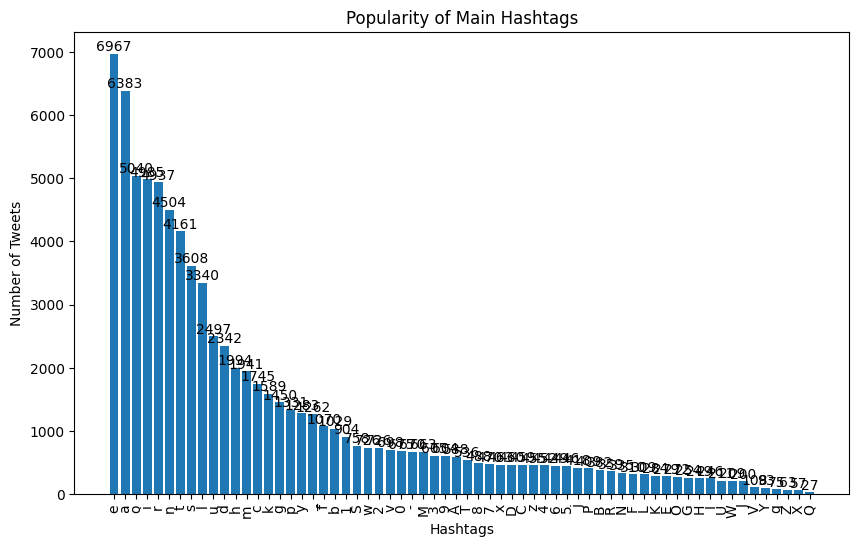

In [ ]:
# Extract the hashtags from the DataFrame
count_hashtags = []
for list in Tweet_df['author']:
    for hashtag in list:
        count_hashtags.append(hashtag)

# Count the occurrences of each hashtag
count_hashtags = Counter(count_hashtags)

# convert to dictionary
count_hashtags = dict(count_hashtags)

# Sort the hashtags by their counts
count_hashtags = sorted(count_hashtags.items(), key=lambda x: x[1], reverse=True)
hashtags_key = [x[0] for x in count_hashtags]
hashtag_counts = [x[1] for x in count_hashtags]

# plot a histogram of hashtag occurrences
plt.figure(figsize=(10,6))
plt.bar(hashtags_key, hashtag_counts)
plt.xticks(rotation=90)
plt.xlabel('Hashtags')
plt.ylabel('Number of Tweets')
plt.title('Popularity of Main Hashtags')

# Add annotations for each bar
for i, count in enumerate(hashtag_counts):
    plt.annotate(str(count), xy=(i, count), ha='center', va='bottom')

plt.show()

Draw a graph that visualise the number of distinct Tweet users per individual hashtag

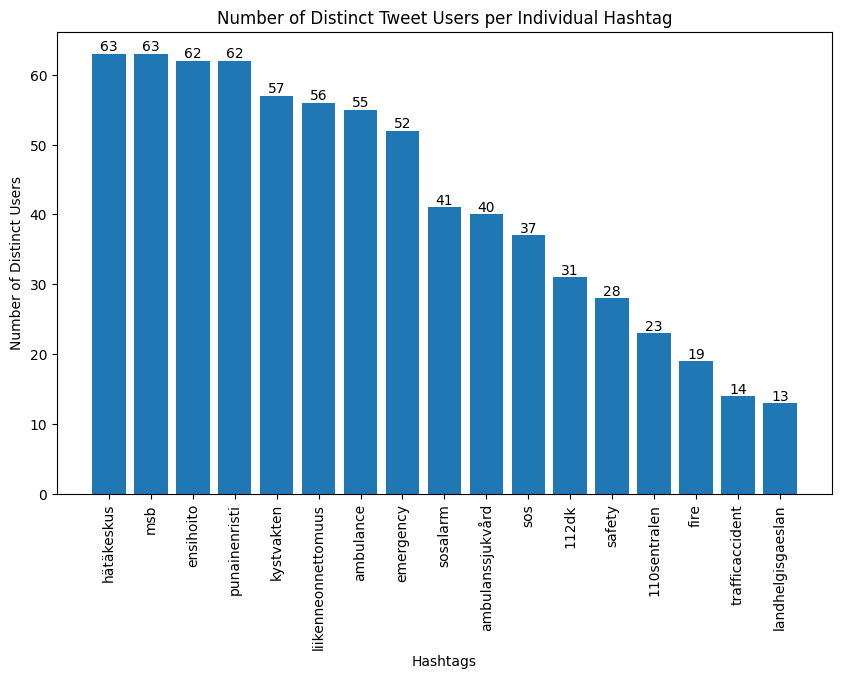

In [ ]:
# Extract the hashtags and users from the DataFrame
hashtags = []
users = []
for i, list in enumerate(Tweet_df['main_hashtag']):
    for hashtag in list:
        hashtags.append(hashtag)
        users.append(Tweet_df['User'][i])

# Count the number of distinct users for each hashtag
distinct_users_per_hashtag = {}
for i, hashtag in enumerate(hashtags):
    if hashtag not in distinct_users_per_hashtag:
        distinct_users_per_hashtag[hashtag] = set(users[i])
    else:
        distinct_users_per_hashtag[hashtag] |= set(users[i])

# Sort the hashtags by their counts
sorted_hashtags = sorted(distinct_users_per_hashtag.items(), key=lambda x: len(x[1]), reverse=True)
hashtags = [x[0] for x in sorted_hashtags]
users = [len(x[1]) for x in sorted_hashtags]

# Plot a bar chart
plt.figure(figsize=(10, 6))
plt.bar(hashtags, users)
plt.xticks(rotation=90)
plt.xlabel('Hashtags')
plt.ylabel('Number of Distinct Users')
plt.title('Number of Distinct Tweet Users per Individual Hashtag')

# Add annotations for each bar
for i, count in enumerate(users):
    plt.annotate(str(count), xy=(i, count), ha='center', va='bottom')

plt.show()

Sentiment Analysis using VADER Tool

In [ ]:
!pip install vaderSentiment

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 126.0/126.0 kB 3.6 MB/s eta 0:00:00


In [ ]:
from google.colab import files
import matplotlib.pyplot as plt

In [ ]:
import plotly.express as px
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer

# filter the dataframe to only include rows where main_hashtag has a value
# df_contain_main_hashtag = Tweet_df[Tweet_df['main_hashtag'].apply(lambda x: len(x) > 0)]
#df_contain_main_hashtag = Tweet_df[Tweet_df['main_hashtag'].str.len() > 0]

# extract the full_text column from the filtered dataframe
Text = Tweet_df["body"]

def sentiment_scores(Text):
    # initialize sentiment analyzer
    analyzer = SentimentIntensityAnalyzer()
    sentiment_dict = []

    # loop through each text and calculate sentiment scores
    for n in Text:
        value = analyzer.polarity_scores(n)
        sentiment_dict.append(value)

    return sentiment_dict


# calculate sentiment scores for the Text column
data = sentiment_scores(Text)

# create a dataframe from the sentiment scores
df = pd.DataFrame(data)

# create a scatter ternary plot using the negative, neutral, and positive sentiment scores
fig = px.scatter_ternary(df, a='neg', b='neu', c='pos')

fig.update_layout(
    title={
        'text': "Ternary Distribution plot",
        'y':.97,
        'x':.5,
        'xanchor': 'center',
        'yanchor': 'top'})

# show the plot
#plt.savefig("abc.png")
#files.download("abc.png")
fig.show()

In [ ]:
len(Tweet_df['main_hashtag'])

NameError: ignored

Now build a social graph where each node corresponds to a hashtag and an edge between hashtag A and hashtag B indicates that there is at least one tweet which contains both hashtag A and hashtag B. Implement a small python program that allows you to identify hashtags in tweet messages and generate the above social network graph.

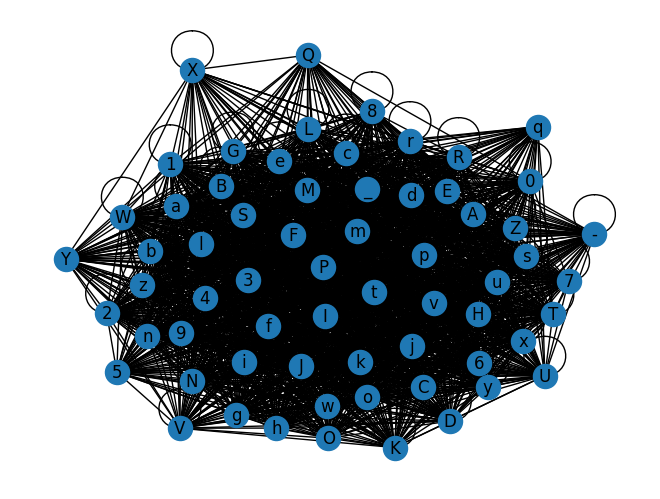

In [3]:
#import required library
import networkx as nx

# create an empty graph
graph = nx.Graph()

# extract the main_hashtag column from the dataframe
hashtags = Tweet_df['author']

length = len(hashtags)

# loop through each row in the main_hashtag column
for i in range(length):
    for j in range(1, len(hashtags[i])):

        # add an edge between the first hashtag and all other hashtags in the row
        graph.add_edge(hashtags[i][0], hashtags[i][j])

# plot the graph
nx.draw(graph, with_labels=True)

In [10]:
dataset = [
    {'post': 'Hi @user1, what do you think about this?', 'author': 'userA'},
    {'post': 'I completely agree with @user2!', 'author': 'userB'},
    {'post': 'Thanks @user3 for your input.', 'author': 'userA'},
    {'post': 'Any recommendations, @user4?', 'author': 'userC'},
    {'post': 'I think @user1 made a valid point.', 'author': 'userD'},
]
for post,author in zip(Tweet_df['body'],Tweet_df['author']):
    print(post)
    print(author)

Streaming output truncated to the last 5000 lines.
Heaven is your destination x2

In the name of harmony

For the grace, for the might of our lord  
For the home of the holy  
For the faith, for the way of the sword  
Gave their lives so boldly

For the grace, for the might of our lord  
In the name of Her glory  
For the faith, for the way of the sword  
Come and tell their story

Gave their lives so boldly  
Come and tell the Royal guards story again

last dying breath

War begun, chrysalis has come  
Day or night, the Love keep fading  
Overrun, but never outdone  
Street to street, denying defeat

Soldiers of the Equestrian army  
Keep your heads held high  
Overrun, you fall one by one  
For Cantorlot and the motherland

Soldiers, Heroes, die for your land  
Your lives are gone, erased by your command

Until your last dying breath x2

Overrun, you’re under the gun  
Day or night, the love kept fading  
Sound the drum, the great war has come  
Show no fear, the ending is near

A fi

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
I was wondering if there is anyone or a couple from the Faroe Islands that would be interested in becoming friends with me and my family. We are 35 with a 10 year old son in Wisconsin. We are very much interested in moving to the Faroe Islands, but want to make a real connection with someone over there first.
We would also invite serious inquiries to stay with us in America for visits so we can build a strong friendship that could hopefully benefit both sides. Almost like we're looking for a "foreign exchange" student to help us learn about the Faroe Islands, and we can teach them about America. In so creating a friendship exchange!
Thanks for your help with this. I really would like to get serious people interested in helping me and my family get to know more about the Faroe Islands. 😊
LinzWood
Hello everyone,

I'm looking for someone who'd be able to help me with a translation of 408 words until Monday.

Thank you in advance
wayofgra

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



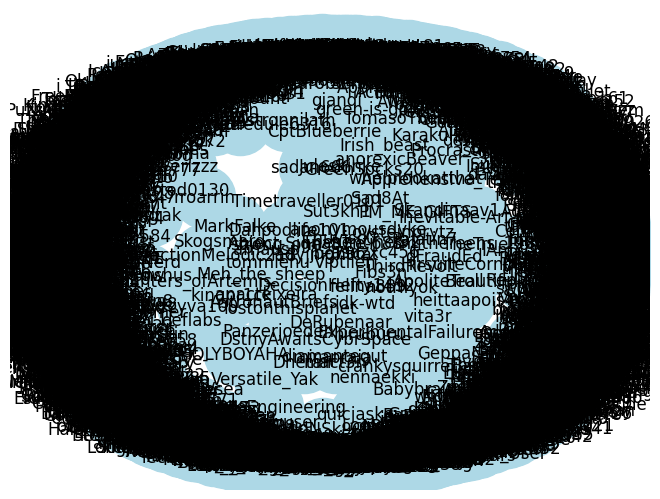

In [11]:

# Create an empty directed graph
G = nx.DiGraph()
dataset = [
    {'post': 'Hi @user1, what do you think about this?', 'author': 'userA'},
    {'post': 'I completely agree with @user2!', 'author': 'userB'},
    {'post': 'Thanks @user3 for your input.', 'author': 'userA'},
    {'post': 'Any recommendations, @user4?', 'author': 'userC'},
    {'post': 'I think @user1 made a valid point.', 'author': 'userD'},
]
# Iterate through the dataset to create nodes and edges
for post,author in zip(Tweet_df['body'],Tweet_df['author']):

    # Add author node if it doesn't exist
    if not G.has_node(author):
        G.add_node(author)

    # Extract mentioned authors from the post
    mentions = [word[1:] for word in post.split() if word.startswith('@')]

    # Add edges between the author and mentioned authors
    for mentioned_author in mentions:
        if not G.has_node(mentioned_author):
            G.add_node(mentioned_author)
        G.add_edge(author, mentioned_author)

# Plot the network
pos = nx.spring_layout(G)
nx.draw(G, pos, with_labels=True, node_color='lightblue', node_size=2000, edge_color='gray', arrowsize=15)

# Customize edge labels (optional)
edge_labels = {(u, v): v for u, v, d in G.edges(data=True)}
nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels)

# Show the plot
plt.show()


In [12]:
data = []
for u, v in G.edges():
    data.append({'Source': u, 'Target': v})

graphdf = pd.DataFrame(data)
csv_file_path = 'redditsocial_author_data.csv'
graphdf.to_csv(csv_file_path, index=False)

In [14]:
auth = pd.read_csv('redditsocial_author_data.csv')
len(auth)

9

In [15]:
import itertools
from nltk import ngrams

def jaccard_similarity(post1, post2):
    n = 2  # n-gram size
    post1_grams = set(ngrams(post1.split(), n))
    post2_grams = set(ngrams(post2.split(), n))
    intersection = len(post1_grams.intersection(post2_grams))
    union = len(post1_grams) + len(post2_grams) - intersection
    return intersection / union

# Calculate Jaccard similarity for every pair of posts
similarities = []
for post1, post2 in itertools.combinations(Tweet_df['body'], 2):
    similarity = jaccard_similarity(post1, post2)
    similarities.append(similarity)

# Compute statistics
max_similarity = max(similarities)
min_similarity = min(similarities)
median_similarity = sorted(similarities)[len(similarities) // 2]
mean_similarity = sum(similarities) / len(similarities)

# Print the results
print("Maximum similarity:", max_similarity)
print("Minimum similarity:", min_similarity)
print("Median similarity:", median_similarity)
print("Mean similarity:", mean_similarity)

Maximum similarity: 1.0
Minimum similarity: 0.0
Median similarity: 0.0044444444444444444
Mean similarity: 0.0063166027878853856


In [23]:
len(similarities) #25938003
#10288625 0.006
#13760524 0.004
#14665319 0.0035
count = 0
for num in similarities:
  if num > 0.5:
    count += 1
print(count)

15379


In [18]:
import itertools
from nltk import ngrams
for post1, post2 in itertools.combinations(Tweet_df['body'], 2):


Streaming output truncated to the last 5000 lines.

That's the current journey where we're skipping most of inland Finland and aiming for the national parks in Sweden and Norway. We have seven days to do this.

Any tips or sights you think we must see will be so helpful because we have no idea and there isn't much research out there.
 Hey everyone!

https://preview.redd.it/pmsotitgy2oa1.png?width=923&format=png&auto=webp&v=enabled&s=4204741130f5ab928aa4814773d88b3e978f3238

A couple of friends of mine are making a road trip around the Bay of Bothnia in Finland x Sweden. Helsinki to Stockholm, but we're confused about what exactly we should be targeting, i.e. the wilderness of Finland and then stick to the coastline to make up time or what attractions we need to see as a must.

That's the current journey where we're skipping most of inland Finland and aiming for the national parks in Sweden and Norway. We have seven days to do this.

Any tips or sights you think we must see will be so h

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
Preferably a song not in English, and that really captures the feeling of your country's music.

**What countries are already in the playlist?**

So far we have:

* Faroe Islands

* Germany

* Japan

* Mexico

* Norway

* Pakistan

* Portugal

* San marino

* And thanks to our first post on reddit, Finland!

Thank you and we hope you can contribute to this project :)

Here is the link to the playlist: [Spotify - All around the world](https://open.spotify.com/playlist/7n4kZc0adGRwSm0Jf7UFlG?si=9oz_cIZHRFCt9n9scExOVA&utm_source=copy-link)

Edit: Added /u/frostyc0bra suggestion: Ted gärdestad - sol, vind och vatten. Thank you everyone!!!
Hello everyone!

Me and my sister-in-law are making a Spotify playlist and trying to put 1 song from each country in the world. I'm starting with european countries (aside from the ones I already knew), and would really appreciate your help!

**What are we looking for?**

Preferably a song not in English,

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Hej alla, 
My fiance and I and some friends are trying to plan a special getaway in Sweden for about a week.  I hear you are very friendly on the subreddit and might be able to offer some help! We're a little overwhelmed navigating the online world and language barriers in doing our research. 
Basically we would like to spend about a week in July in the Swedish countryside somewhere. There are 4 couples (one Swedish couple, and 3 from Australia) and we are trying to find some cabins where we can have a quiet summer holiday like we hear is common in Swedish culture - reading, hiking, cycling, fishing, kayaking/canoeing, etc. during the day; meals together at night. 
However to add to the fun, we would like to get married during this week away. Just the 8 of us, plus an officiant and possibly a photographer. So very small and relaxed. Maybe getting married in the forest under the trees. 

Are we crazy? Our Swedish friends initially suggested here https://kolasen.se/en/home but they are c

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




I’m not 100% sure if it’s Swedish, but the end credits made it seem like it was, and I either watched it in English, or dubbed English. But we’ll see.

It’s a movie that revolves around tattoos. There’s a kid, maybe teenager or in his 20s. He lives with an uncle or an elder guardian. First scene I distinctly remember was that he was in a sauna with this guardian and a bunch of the guardian’s old friends. Their sitting, and he’s standing in front of them listening to them talk about tattoos. They talk to him about how and why he wants to become a tattoo artist, and how there’s a meaning behind every tattoo, that he should draw his on paper and keep tweaking before committing to it.

Then there’s a sort of montage of him giving people tattoos out of a shop and how he keeps drawing his tattoo on paper and working on it constantly. And there’s a scene where a guy comes to visit him at his home, they talk, then the guy puts money on the table. Then the guardian walks into the house, sees m

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




I’m not 100% sure if it’s Swedish, but the end credits made it seem like it was, and I either watched it in English, or dubbed English. But we’ll see.

It’s a movie that revolves around tattoos. There’s a kid, maybe teenager or in his 20s. He lives with an uncle or an elder guardian. First scene I distinctly remember was that he was in a sauna with this guardian and a bunch of the guardian’s old friends. Their sitting, and he’s standing in front of them listening to them talk about tattoos. They talk to him about how and why he wants to become a tattoo artist, and how there’s a meaning behind every tattoo, that he should draw his on paper and keep tweaking before committing to it.

Then there’s a sort of montage of him giving people tattoos out of a shop and how he keeps drawing his tattoo on paper and working on it constantly. And there’s a scene where a guy comes to visit him at his home, they talk, then the guy puts money on the table. Then the guardian walks into the house, sees m

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
Greetings my fellow neighbours !! I need your help. Me and my Girlfriend is going on a Camping trip to Sweden march. I really dont know where i should wildcamp in sweden. Is there any good places not far from denmark ? Im thinking like 1-2 hour drive max. Any ideas would be really appreciated!
Greetings my fellow neighbours !! I need your help. Me and my Girlfriend is going on a Camping trip to Sweden march. I really dont know where i should wildcamp in sweden. Is there any good places not far from denmark ? Im thinking like 1-2 hour drive max. Any ideas would be really appreciated!
Greetings my fellow neighbours !! I need your help. Me and my Girlfriend is going on a Camping trip to Sweden march. I really dont know where i should wildcamp in sweden. Is there any good places not far from denmark ? Im thinking like 1-2 hour drive max. Any ideas would be really appreciated!
Greetings my fellow neighbours !! I need your help. Me and my Gi

KeyboardInterrupt: ignored

In [ ]:
import itertools
from nltk import ngrams

# Convert DataFrame to list of dictionaries
dataset = Tweet_df.to_dict('records')
# Function to calculate Jaccard similarity
def jaccard_similarity(post1, post2):
    n = 2  # n-gram size
    post1_grams = set(ngrams(post1.split(), n))
    post2_grams = set(ngrams(post2.split(), n))
    intersection = len(post1_grams.intersection(post2_grams))
    union = len(post1_grams) + len(post2_grams) - intersection
    return intersection / union

# Create an empty graph
G = nx.Graph()

# Calculate Jaccard similarity for every pair of posts
for post1, post2 in itertools.combinations(dataset, 2):
    similarity = jaccard_similarity(post1['body'], post2['body'])
    if similarity > 0.006:
        author1 = post1['author']
        author2 = post2['author']
        G.add_edge(author1, author2, weight=similarity)

# Plot the network
pos = nx.spring_layout(G)
weights = [G[u][v]['weight'] for u, v in G.edges()]
nx.draw(G, pos, with_labels=True, node_color='lightblue', node_size=2000, edge_color='gray', width=weights, edge_cmap=plt.cm.Blues, arrows=True)

# Customize edge labels (optional)
edge_labels = {(u, v): f"{G[u][v]['weight']:.3f}" for u, v in G.edges()}
nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels)

# Show the plot
plt.show()

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt

# Create an empty graph
graph = nx.Graph()

# Extract the main_hashtag column from the dataframe
hashtags = Tweet_df['all_hashtag']

length = len(hashtags)

# Loop through each row in the main_hashtag column
for i in range(length):
    for j in range(1, len(hashtags[i])):
        # Add an edge between the first hashtag and all other hashtags in the row
        graph.add_edge(hashtags[i][0], hashtags[i][j])

# Create the layout for the graph
layout = nx.spring_layout(graph)

# Plot the graph using matplotlib and pygraphviz
plt.figure(figsize=(100, 100))
nx.draw_networkx(graph, pos=layout, with_labels=True, node_size=10, font_size=8, alpha=0.7, linewidths=0.3)
plt.axis('off')
plt.show()


Degree Distribution and Local Clustering Coefficient Distribution

In [ ]:
# calculate the graph properties
num_nodes = graph.number_of_nodes()
num_edges = graph.number_of_edges()
avg_degree_centrality = nx.degree_centrality(graph)

# loop to iterate for values
resulted = dict()
for key in avg_degree_centrality:

    # rounding to K using round()
    resulted[key] = round(avg_degree_centrality[key], 2)

avg_degree_centrality = str(resulted)


clustering_coefficient = nx.average_clustering(graph)
largest_component_size = len(max(nx.connected_components(graph), key=len))

# create the summary table
table = [
    ["Number of nodes", num_nodes],
    ["Number of edges", num_edges],
    ["Average degree centrality", avg_degree_centrality],
    ["Clustering coefficient", round(clustering_coefficient,2)],
    ["Size of largest component", largest_component_size]
]

# print the table
print("Graph Summary Table:")
for row in table:
    print("{:<28} {:<10}".format(row[0], row[1]))

Graph Summary Table:
Number of nodes              64        
Number of edges              1931      
Average degree centrality    {'K': 0.95, 'u': 0.98, 's': 1.03, 'h': 1.0, 'i': 1.03, 'n': 1.03, 'a': 1.03, 't': 1.03, 'r': 1.03, 'w': 0.98, 'b': 1.02, 'e': 1.03, 'c': 1.02, 'm': 1.03, 'f': 1.02, 'o': 1.03, 'l': 1.03, 'g': 0.98, 'p': 1.0, 'y': 0.98, 'P': 1.02, 'k': 1.02, 'E': 1.0, 'D': 0.98, 'U': 0.9, 'v': 1.0, 'F': 1.0, 'x': 0.95, 'I': 0.97, '-': 0.84, 'A': 1.03, '2': 0.94, '5': 0.84, '3': 0.92, 'z': 0.9, 'd': 1.03, '_': 0.92, 'j': 0.97, 'C': 1.0, '1': 1.0, '4': 0.95, 'T': 1.02, '0': 0.9, '9': 0.87, 'R': 1.0, '8': 0.87, '7': 0.89, 'G': 0.97, 'M': 1.03, 'B': 1.03, 'W': 0.97, '6': 0.89, 'S': 1.03, 'O': 1.02, 'J': 0.98, 'Q': 0.63, 'H': 0.98, 'V': 0.89, 'L': 1.0, 'N': 1.0, 'Z': 0.79, 'X': 0.59, 'Y': 0.81, 'q': 0.68}
Clustering coefficient       0.94      
Size of largest component    64        
